# Importing Modules

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# Import Data

In [38]:
# df = pd.read_excel("data.xlsx")
# df.to_csv(r'/Users/anuragprasad/Desktop/GitHub/EDA/data.csv',index=None,header=True)
df = pd.read_csv("data.csv")
print(df.shape)

(31549, 7)


In [39]:
df['time'] = pd.to_datetime(df['time'])
df.head()

,time,Cyclone_Inlet_Gas_Temp,Cyclone_Material_Temp,Cyclone_Outlet_Gas_draft,Cyclone_cone_draft,Cyclone_Gas_Outlet_Temp,Cyclone_Inlet_Draft
0,2017-01-01 00:00:00,883.713333,933.111667,-182.855000,-177.127500,871.658333,-146.322500
1,2017-01-01 01:00:00,875.574167,926.837500,-179.320000,-171.834167,868.905833,-144.253333
2,2017-01-01 02:00:00,876.804167,933.455000,-177.724167,-166.126667,874.572500,-144.327500
3,2017-01-01 03:00:00,877.250000,933.257500,-178.219167,-163.460833,871.305000,-144.110000
4,2017-01-01 04:00:00,874.260833,936.023333,-178.020000,-159.367500,870.639167,-143.010000


In [40]:
df.isna().sum()

time                          0
Cyclone_Inlet_Gas_Temp      144
Cyclone_Material_Temp       144
Cyclone_Outlet_Gas_draft    144
Cyclone_cone_draft          144
Cyclone_Gas_Outlet_Temp     144
Cyclone_Inlet_Draft         144
dtype: int64

In [41]:
df.describe(include = 'all')

<ipython-input-41-74aa2f970831>:1: FutureWarning:

Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.



,time,Cyclone_Inlet_Gas_Temp,Cyclone_Material_Temp,Cyclone_Outlet_Gas_draft,Cyclone_cone_draft,Cyclone_Gas_Outlet_Temp,Cyclone_Inlet_Draft
count,31549,31405.000000,31405.000000,31405.000000,31405.000000,31405.000000,31405.000000
unique,31549,NaN,NaN,NaN,NaN,NaN,NaN
top,2019-02-21 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN
first,2017-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN
last,2020-08-07 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,727.247932,750.707829,-177.781707,-164.542065,715.659313,-141.271891
std,NaN,328.193718,347.770730,98.693850,89.538068,325.085337,77.174359
min,NaN,14.483333,-185.000000,-328.445000,-306.015833,13.880833,-272.780833
25%,NaN,864.747500,878.186667,-247.097500,-226.496667,803.219167,-193.482500


# Data Cleaning

In [42]:
data_columns = df.columns.tolist()
num_df = (df.drop(data_columns, axis=1).join(df[data_columns].apply(pd.to_numeric, errors='coerce')))

In [43]:
num_df.describe()

,time,Cyclone_Inlet_Gas_Temp,Cyclone_Material_Temp,Cyclone_Outlet_Gas_draft,Cyclone_cone_draft,Cyclone_Gas_Outlet_Temp,Cyclone_Inlet_Draft
count,3.154900e+04,31405.000000,31405.000000,31405.000000,31405.000000,31405.000000,31405.000000
mean,1.540015e+18,727.247932,750.707829,-177.781707,-164.542065,715.659313,-141.271891
std,3.278720e+16,328.193718,347.770730,98.693850,89.538068,325.085337,77.174359
min,1.483229e+18,14.483333,-185.000000,-328.445000,-306.015833,13.880833,-272.780833
25%,1.511622e+18,864.747500,878.186667,-247.097500,-226.496667,803.219167,-193.482500
50%,1.540015e+18,886.430833,917.609167,-215.498333,-198.500000,873.196667,-169.589167
75%,1.568408e+18,899.850000,939.712500,-170.476667,-145.459167,899.044167,-136.612500
max,1.596802e+18,1064.556667,1204.380000,30.434000,12.421667,1314.667500,30.027500


In [44]:
num_df['time'] = pd.to_datetime(num_df['time'])

In [45]:
df = num_df.set_index('time').resample('H').mean().reset_index()
df.head()

,time,Cyclone_Inlet_Gas_Temp,Cyclone_Material_Temp,Cyclone_Outlet_Gas_draft,Cyclone_cone_draft,Cyclone_Gas_Outlet_Temp,Cyclone_Inlet_Draft
0,2017-01-01 00:00:00,883.713333,933.111667,-182.855000,-177.127500,871.658333,-146.322500
1,2017-01-01 01:00:00,875.574167,926.837500,-179.320000,-171.834167,868.905833,-144.253333
2,2017-01-01 02:00:00,876.804167,933.455000,-177.724167,-166.126667,874.572500,-144.327500
3,2017-01-01 03:00:00,877.250000,933.257500,-178.219167,-163.460833,871.305000,-144.110000
4,2017-01-01 04:00:00,874.260833,936.023333,-178.020000,-159.367500,870.639167,-143.010000


# Data Vizualization

In [65]:
#express to plot entire data
fig = px.line(df.reset_index(), x=data_columns[0], y=data_columns[1], title='Cyclone Inlet Gas Temperature')
#slider
fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
        buttons = list([
              dict(count=1, label='1y', step="year", stepmode="backward"),
              dict(count=2, label='2y', step="year", stepmode="backward"),
              dict(count=5, label='5y', step="year", stepmode="backward")
        ])
    )
)
fig.show()

In [66]:
#express to plot entire data
fig = px.line(df.reset_index(), x=data_columns[0], y=data_columns[2], title=data_columns[2])
#slider
fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
        buttons = list([
              dict(count=1, label='1y', step="year", stepmode="backward"),
              dict(count=2, label='2y', step="year", stepmode="backward"),
              dict(count=2, label='5y', step="year", stepmode="backward")
        ])
    )
)
fig.show()

In [67]:
#express to plot entire data
fig = px.line(df.reset_index(), x=data_columns[0], y=data_columns[3], title=data_columns[3])
#slider
fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
        buttons = list([
              dict(count=1, label='1y', step="year", stepmode="backward"),
              dict(count=2, label='2y', step="year", stepmode="backward"),
              dict(count=2, label='5y', step="year", stepmode="backward")
        ])
    )
)
fig.show()

In [68]:
#express to plot entire data
fig = px.line(df.reset_index(), x=data_columns[0], y=data_columns[4], title=data_columns[4])
#slider
fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
        buttons = list([
              dict(count=1, label='1y', step="year", stepmode="backward"),
              dict(count=2, label='2y', step="year", stepmode="backward"),
              dict(count=2, label='5y', step="year", stepmode="backward")
        ])
    )
)
fig.show()

In [69]:
#express to plot entire data
fig = px.line(df.reset_index(), x=data_columns[0], y=data_columns[5], title=data_columns[5])
#slider
fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
        buttons = list([
              dict(count=1, label='1y', step="year", stepmode="backward"),
              dict(count=2, label='2y', step="year", stepmode="backward"),
              dict(count=2, label='5y', step="year", stepmode="backward")
        ])
    )
)
fig.show()

In [70]:
#express to plot entire data
fig = px.line(df.reset_index(), x=data_columns[0], y=data_columns[6], title=data_columns[6])
#slider
fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
        buttons = list([
              dict(count=1, label='1y', step="year", stepmode="backward"),
              dict(count=2, label='2y', step="year", stepmode="backward"),
              dict(count=2, label='5y', step="year", stepmode="backward")
        ])
    )
)
fig.show()

<AxesSubplot:>

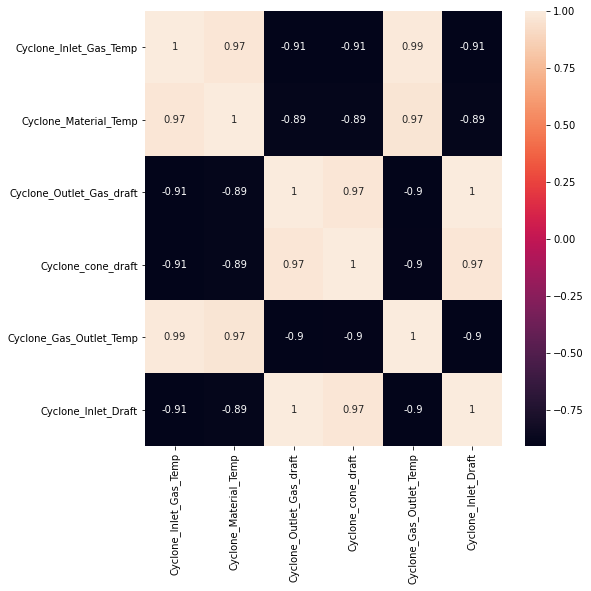

In [74]:
corr = df.corr()
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(corr,annot=True,ax=ax)

# Outliers Marking

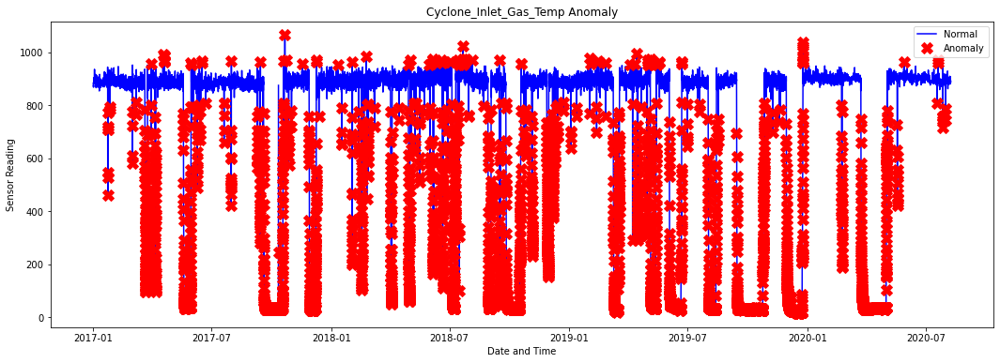

In [79]:
df_mod = df.set_index("time")
# Anomaliy Detection using IQR
q1_pc1, q3_pc1 = df_mod['Cyclone_Inlet_Gas_Temp'].quantile([0.25, 0.75])
iqr_pc1 = q3_pc1 - q1_pc1

# Calculate upper and lower bounds for outlier for col1
lower_pc1 = q1_pc1 - (1.5*iqr_pc1)
upper_pc1 = q3_pc1 + (1.5*iqr_pc1)

# Filter out the outliers from the col1
df_mod['anomaly_Cyclone_Inlet_Gas_Temp'] = ((df_mod['Cyclone_Inlet_Gas_Temp'] > upper_pc1) | (
    df_mod['Cyclone_Inlet_Gas_Temp'] < lower_pc1)).astype('float')


# Let's plot the outliers from anomaly_col on top of the normal_col and see where they occured in the time series
a = df_mod[df_mod['anomaly_Cyclone_Inlet_Gas_Temp'] == 1]  # anomaly
_ = plt.figure(figsize=(18, 6))
_ = plt.plot(df_mod['Cyclone_Inlet_Gas_Temp'], color='blue', label='Normal')
_ = plt.plot(a['Cyclone_Inlet_Gas_Temp'], linestyle='none', marker='X',
             color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Cyclone_Inlet_Gas_Temp Anomaly')
_ = plt.legend(loc='best')
plt.show()

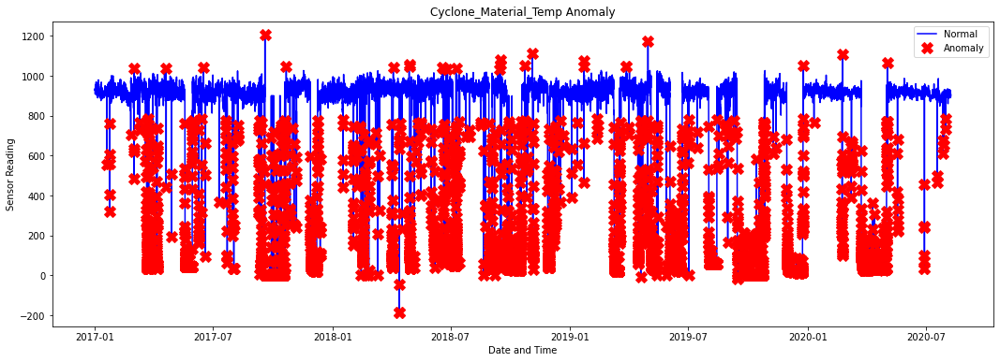

In [54]:
f_mod = df.set_index("time")
# Anomaliy Detection using IQR
q1_pc1, q3_pc1 = df_mod['Cyclone_Material_Temp'].quantile([0.25, 0.75])
iqr_pc1 = q3_pc1 - q1_pc1

# Calculate upper and lower bounds for outlier for col1
lower_pc1 = q1_pc1 - (1.5*iqr_pc1)
upper_pc1 = q3_pc1 + (1.5*iqr_pc1)

# Filter out the outliers from the col1
df_mod['anomaly_Cyclone_Material_Temp'] = ((df_mod['Cyclone_Material_Temp'] > upper_pc1) | (
    df_mod['Cyclone_Material_Temp'] < lower_pc1)).astype('float')


# Let's plot the outliers from anomaly_col on top of the normal_col and see where they occured in the time series
a = df_mod[df_mod['anomaly_Cyclone_Material_Temp'] == 1]  # anomaly
_ = plt.figure(figsize=(18, 6))
_ = plt.plot(df_mod['Cyclone_Material_Temp'], color='blue', label='Normal')
_ = plt.plot(a['Cyclone_Material_Temp'], linestyle='none', marker='X',
             color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Cyclone_Material_Temp Anomaly')
_ = plt.legend(loc='best')
plt.show()

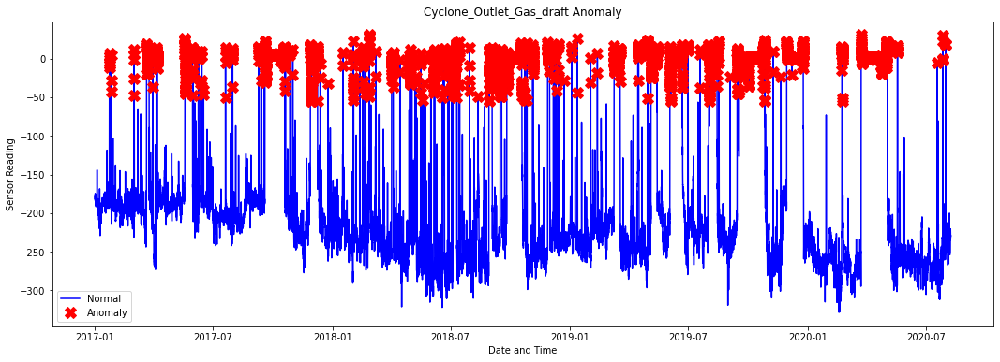

In [55]:
df_mod = df.set_index("time")
# Anomaliy Detection using IQR
q1_pc1, q3_pc1 = df_mod['Cyclone_Outlet_Gas_draft'].quantile([0.25, 0.75])
iqr_pc1 = q3_pc1 - q1_pc1

# Calculate upper and lower bounds for outlier for col1
lower_pc1 = q1_pc1 - (1.5*iqr_pc1)
upper_pc1 = q3_pc1 + (1.5*iqr_pc1)

# Filter out the outliers from the col1
df_mod['anomaly_Cyclone_Outlet_Gas_draft'] = ((df_mod['Cyclone_Outlet_Gas_draft'] > upper_pc1) | (
    df_mod['Cyclone_Outlet_Gas_draft'] < lower_pc1)).astype('float')


# Let's plot the outliers from anomaly_col on top of the normal_col and see where they occured in the time series
a = df_mod[df_mod['anomaly_Cyclone_Outlet_Gas_draft'] == 1]  # anomaly
_ = plt.figure(figsize=(18, 6))
_ = plt.plot(df_mod['Cyclone_Outlet_Gas_draft'], color='blue', label='Normal')
_ = plt.plot(a['Cyclone_Outlet_Gas_draft'], linestyle='none', marker='X',
             color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Cyclone_Outlet_Gas_draft Anomaly')
_ = plt.legend(loc='best')
plt.show()


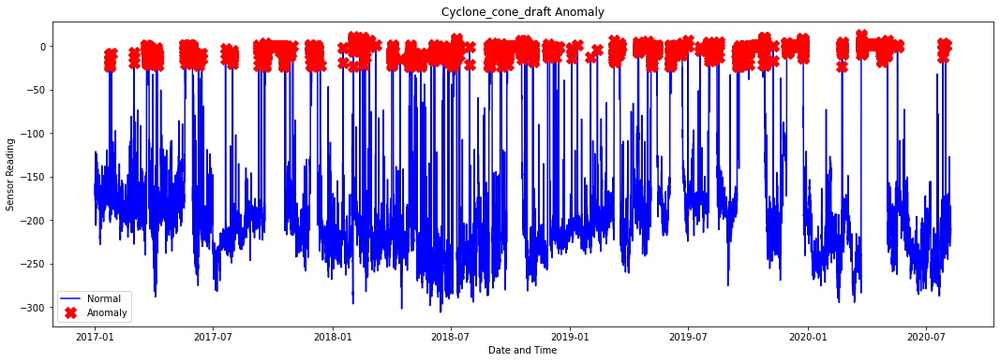

In [56]:
df_mod = df.set_index("time")
# Anomaliy Detection using IQR
q1_pc1, q3_pc1 = df_mod['Cyclone_cone_draft'].quantile([0.25, 0.75])
iqr_pc1 = q3_pc1 - q1_pc1

# Calculate upper and lower bounds for outlier for col1
lower_pc1 = q1_pc1 - (1.5*iqr_pc1)
upper_pc1 = q3_pc1 + (1.5*iqr_pc1)

# Filter out the outliers from the col1
df_mod['anomaly_Cyclone_cone_draft'] = ((df_mod['Cyclone_cone_draft'] > upper_pc1) | (
    df_mod['Cyclone_cone_draft'] < lower_pc1)).astype('float')


# Let's plot the outliers from anomaly_col on top of the normal_col and see where they occured in the time series
a = df_mod[df_mod['anomaly_Cyclone_cone_draft'] == 1]  # anomaly
_ = plt.figure(figsize=(18, 6))
_ = plt.plot(df_mod['Cyclone_cone_draft'], color='blue', label='Normal')
_ = plt.plot(a['Cyclone_cone_draft'], linestyle='none', marker='X',
             color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Cyclone_cone_draft Anomaly')
_ = plt.legend(loc='best')
plt.show()

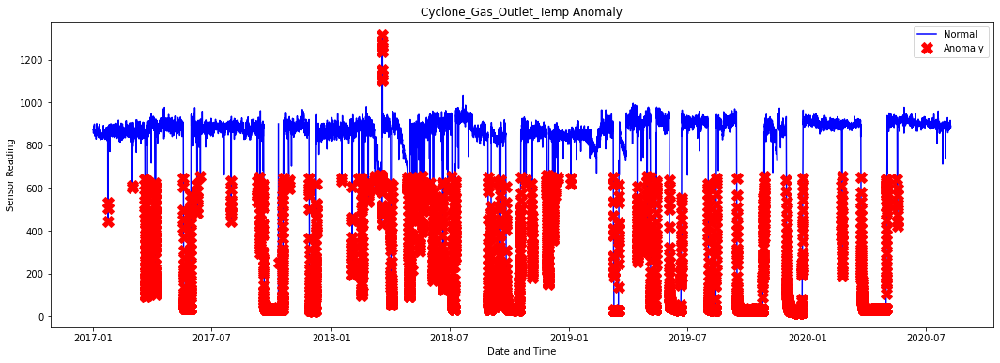

In [57]:
df_mod = df.set_index("time")
# Anomaliy Detection using IQR
q1_pc1, q3_pc1 = df_mod['Cyclone_Gas_Outlet_Temp'].quantile([0.25, 0.75])
iqr_pc1 = q3_pc1 - q1_pc1

# Calculate upper and lower bounds for outlier for col1
lower_pc1 = q1_pc1 - (1.5*iqr_pc1)
upper_pc1 = q3_pc1 + (1.5*iqr_pc1)

# Filter out the outliers from the col1
df_mod['anomaly_Cyclone_Gas_Outlet_Temp'] = ((df_mod['Cyclone_Gas_Outlet_Temp'] > upper_pc1) | (
    df_mod['Cyclone_Gas_Outlet_Temp'] < lower_pc1)).astype('float')


# Let's plot the outliers from anomaly_col on top of the normal_col and see where they occured in the time series
a = df_mod[df_mod['anomaly_Cyclone_Gas_Outlet_Temp'] == 1]  # anomaly
_ = plt.figure(figsize=(18, 6))
_ = plt.plot(df_mod['Cyclone_Gas_Outlet_Temp'], color='blue', label='Normal')
_ = plt.plot(a['Cyclone_Gas_Outlet_Temp'], linestyle='none', marker='X',
             color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Cyclone_Gas_Outlet_Temp Anomaly')
_ = plt.legend(loc='best')
plt.show()

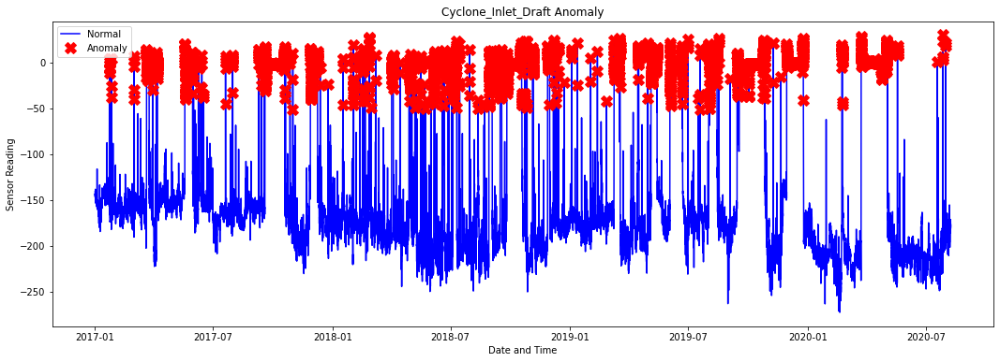

In [58]:
df_mod = df.set_index("time")
# Anomaliy Detection using IQR
q1_pc1, q3_pc1 = df_mod['Cyclone_Inlet_Draft'].quantile([0.25, 0.75])
iqr_pc1 = q3_pc1 - q1_pc1

# Calculate upper and lower bounds for outlier for col1
lower_pc1 = q1_pc1 - (1.5*iqr_pc1)
upper_pc1 = q3_pc1 + (1.5*iqr_pc1)

# Filter out the outliers from the col1
df_mod['anomaly_Cyclone_Inlet_Draft'] = ((df_mod['Cyclone_Inlet_Draft'] > upper_pc1) | (
    df_mod['Cyclone_Inlet_Draft'] < lower_pc1)).astype('float')


# Let's plot the outliers from anomaly_col on top of the normal_col and see where they occured in the time series
a = df_mod[df_mod['anomaly_Cyclone_Inlet_Draft'] == 1]  # anomaly
_ = plt.figure(figsize=(18, 6))
_ = plt.plot(df_mod['Cyclone_Inlet_Draft'], color='blue', label='Normal')
_ = plt.plot(a['Cyclone_Inlet_Draft'], linestyle='none', marker='X',
             color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Cyclone_Inlet_Draft Anomaly')
_ = plt.legend(loc='best')
plt.show()